In [1]:
import tensorflow as tf
import numpy as np
import bilby
import os
import sys
import json
import tensorflow as tf
import matplotlib.pyplot as plt
import scipy.signal as signal
import corner
import random
import copy
import time
#model_dir = "/home/joseph.bayley/public_html/CBC/vitamin_O4MDC/BBH_1024.0Hz_1s_fullparam_massconstrain_corr/vitamin_basic_run0_1024_1s_4conv128_64_32_16_jointm1m2_ramp400_noregularization_AdamW_notimeaug_m1m2_batchnorm"
#sys.path.append(model_dir)
#from vitamin_c_model_fit import CVAE
sys.path.append("../vitamin_c")
from load_data_fit import DataLoader
from vitamin_c_fit import plot_posterior, get_params
import h5py

/home/joseph.bayley/.conda/envs/vitc_newkeras/lib/python3.7/site-packages/tensorflow_addons/utils/ensure_tf_install.py:67: UserWarning: Tensorflow Addons supports using Python ops for all Tensorflow versions above or equal to 2.3.0 and strictly below 2.6.0 (nightly versions are not supported). 
 The versions of TensorFlow you are currently using is 2.6.0 and is not supported. 
Some things might work, some things might not.
If you were to encounter a bug, do not file an issue.
If you want to make sure you're using a tested and supported configuration, either change the TensorFlow version or the TensorFlow Addons's version. 
You can find the compatibility matrix in TensorFlow Addon's readme:
https://github.com/tensorflow/addons
  UserWarning,


In [2]:
%load_ext line_profiler

In [3]:
%matplotlib inline

In [4]:
load_dir = "/home/joseph.bayley/data/CBC/O4/training_polarisations_gaussnoise_2det_15par_1024Hz_1s_chrisparamoriginal/tset_tot-10000000_split-1000/"
val_dir = "/home/joseph.bayley/data/CBC/O4/validation_sets_gaussnoise_2det_15par_1024Hz_1s_chrisparamoriginal/tset_tot-1000_split-1000/"
test_dir = "/home/joseph.bayley/data/CBC/O4/test_sets_gaussnoise/1024Hz_1s_full_15par_2det_chrisparamoriginal/test_waveforms"
load_dir2 = "/home/joseph.bayley/data/CBC/O4/training_waveform_gaussnoise_2det_15par_1024Hz_1s_chrisparamoriginal/tset_tot-10000000_split-1000/"

In [5]:
params_dir = "../vitamin_c/params_files_1024Hz_1s_polarisation_chrispriororiginal/"
params = os.path.join(params_dir, 'params.json')
bounds = os.path.join(params_dir, 'bounds.json')
fixed_vals = os.path.join(params_dir, 'fixed_vals.json')

with open(params, 'r') as fp:
    params = json.load(fp)
with open(bounds, 'r') as fp:
    bounds = json.load(fp)
with open(fixed_vals, 'r') as fp:
    fixed_vals = json.load(fp)

In [6]:
params_dir2 = "../vitamin_c/params_files_1024Hz_1s_chrispriororiginal/"
params2 = os.path.join(params_dir2, 'params.json')
bounds2 = os.path.join(params_dir2, 'bounds.json')
fixed_vals2 = os.path.join(params_dir2, 'fixed_vals.json')

with open(params2, 'r') as fp:
    params2 = json.load(fp)
with open(bounds2, 'r') as fp:
    bounds2 = json.load(fp)
with open(fixed_vals2, 'r') as fp:
    fixed_vals2 = json.load(fp)

In [7]:
params, bounds, masks, fixed_vals = get_params(params, bounds, fixed_vals, params_dir = params_dir)

... converted RA bounds to hour angle
[False, False, True, False, False, False, False, False, False, False, False, False, False, True, True]
[True, True, False, True, True, True, True, True, True, True, True, True, True, False, False]
[ 3  4  0  5  6  7  8  9 10 11 12 13 14  1  2]
['mass_1', 'mass_2', 'luminosity_distance', 'geocent_time', 'phase', 'theta_jn', 'psi', 'a_1', 'a_2', 'tilt_1', 'tilt_2', 'phi_12', 'phi_jl', 'ra', 'dec']
[False, False, False, False, False, False, False, False, False, False, False, False, False, False, False] []
[False, False, True, True, True, True, True, True, True, True, True, True, True, True, True] [2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]
[True, False, False, False, False, False, False, False, False, False, False, False, False, False, False] [0]
[False, True, False, False, False, False, False, False, False, False, False, False, False, False, False] [1]
[False, False, False, False, False, False, False, False, False, False, False, False, False, False,

In [8]:
params2, bounds2, masks2, fixed_vals2 = get_params(params2, bounds2, fixed_vals2, params_dir = params_dir2)

... converted RA bounds to hour angle
[False, False, True, False, False, False, False, False, False, False, False, False, False, True, True]
[True, True, False, True, True, True, True, True, True, True, True, True, True, False, False]
[ 3  4  0  5  6  7  8  9 10 11 12 13 14  1  2]
['mass_1', 'mass_2', 'luminosity_distance', 'geocent_time', 'phase', 'theta_jn', 'psi', 'a_1', 'a_2', 'tilt_1', 'tilt_2', 'phi_12', 'phi_jl', 'ra', 'dec']
[False, False, False, False, False, False, False, False, False, False, False, False, False, False, False] []
[False, False, True, True, True, True, True, True, True, True, True, True, True, True, True] [2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]
[True, False, False, False, False, False, False, False, False, False, False, False, False, False, False] [0]
[False, True, False, False, False, False, False, False, False, False, False, False, False, False, False] [1]
[False, False, False, False, False, False, False, False, False, False, False, False, False, False,

In [9]:
test = DataLoader(test_dir, params = params, bounds = bounds, fixed_vals = fixed_vals, masks=masks,test_set = True, chunk_batch = 40)

In [10]:
dt = DataLoader(load_dir, params = params, bounds = bounds, fixed_vals = fixed_vals, masks=masks,test_set = False, chunk_batch = 40)

In [11]:
dt2 = DataLoader(load_dir2, params = params2, bounds = bounds2, fixed_vals = fixed_vals2, masks=masks2,test_set = False, chunk_batch = 40)

In [12]:
dt.load_next_chunk() 

../vitamin_c/load_data_fit.py:259: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  data['x_data'] = np.concatenate(np.array(data['x_data']), axis=0).squeeze()
../vitamin_c/load_data_fit.py:264: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  data['y_hplus_hcross'] = np.transpose(np.concatenate(np.array(data['y_hplus_hcross']), axis=0),[0,2,1])
/home/joseph.bayley/.local/lib/python3.7/site-packages/bilby/gw/detector/psd.py:362: RuntimeWarning: invalid value encountered in multiply
  frequency_domain_strain = self.__power_spectral_density_interpolated(freque

load_time chunk 0: 22.245747804641724


In [13]:
dt2.load_next_chunk() 

../vitamin_c/load_data_fit.py:266: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  data['y_data_noisefree'] = np.transpose(np.concatenate(np.array(data['y_data_noisefree']), axis=0),[0,2,1])


load_time chunk 0: 4.7559356689453125


In [14]:
test.load_next_chunk()

In [25]:
convpars = dt.unconvert_parameters(dt.X.cpu().numpy())

Instructions for updating:
Use tf.identity instead.


In [26]:
convpars2 = dt2.unconvert_parameters(dt2.X.cpu().numpy())

In [27]:
convtest = test.unconvert_parameters(test.X.cpu().numpy())

In [28]:
convpars[0]

array([ 4.4273682e+01,  4.3962265e+01,  2.5914778e+03,
        2.8905225e-01,  2.5381346e+00,  1.1584431e+00,
        2.1020262e+00,  2.4821563e-01,  1.9471841e-01,
        1.7479292e+00,  1.0364095e+00,  4.6983814e+00,
        4.5248151e+00,  1.7823684e+00, -9.9876189e-01],
      dtype=float32)

(array([2068., 2059., 2044., 2044., 2038., 2062., 2114., 1989.,
        2018., 2044.]),
 array([1000.0343, 1200.0284, 1400.0226, 1600.0167, 1800.0109,
        2000.0049, 2199.999 , 2399.9932, 2599.9873, 2799.9814,
        2999.9756], dtype=float32),
 <BarContainer object of 10 artists>)

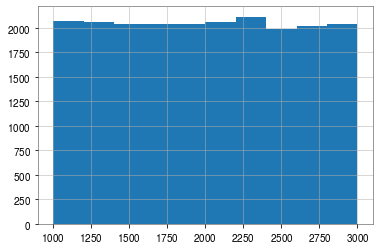

In [22]:
fig, ax = plt.subplots()
ax.hist(convpars[:,2])

In [29]:
clabels = copy.copy(params["corner_labels"])
#clabels.pop("phase")
clabels = [clabels[key] for key in params["inf_pars"]]

In [21]:
print(convpars.shape, len(clabels))

(20480, 15) 14


In [32]:
clabels

['$m_{1}\\,(\\mathrm{M}_{\\odot})$',
 '$m_{2}\\,(\\mathrm{M}_{\\odot})$',
 '$d_{\\mathrm{L}}\\,(\\mathrm{Mpc})$',
 '$t_{0}\\,(\\mathrm{seconds})$',
 '${\\phi}$',
 '$\\Theta_{jn}\\,(\\mathrm{rad})$',
 '${\\psi}$',
 '${a_1}$',
 '${a_2}$',
 '${\\Theta_{1}}$',
 '${\\Theta_{2}}$',
 '${\\phi_{12}}$',
 '${\\phi_{jl}}$',
 '${\\alpha}\\,(\\mathrm{rad})$',
 '${\\delta}\\,(\\mathrm{rad})$']

In [30]:
resamp = np.random.randint(0,len(convpars),2000)

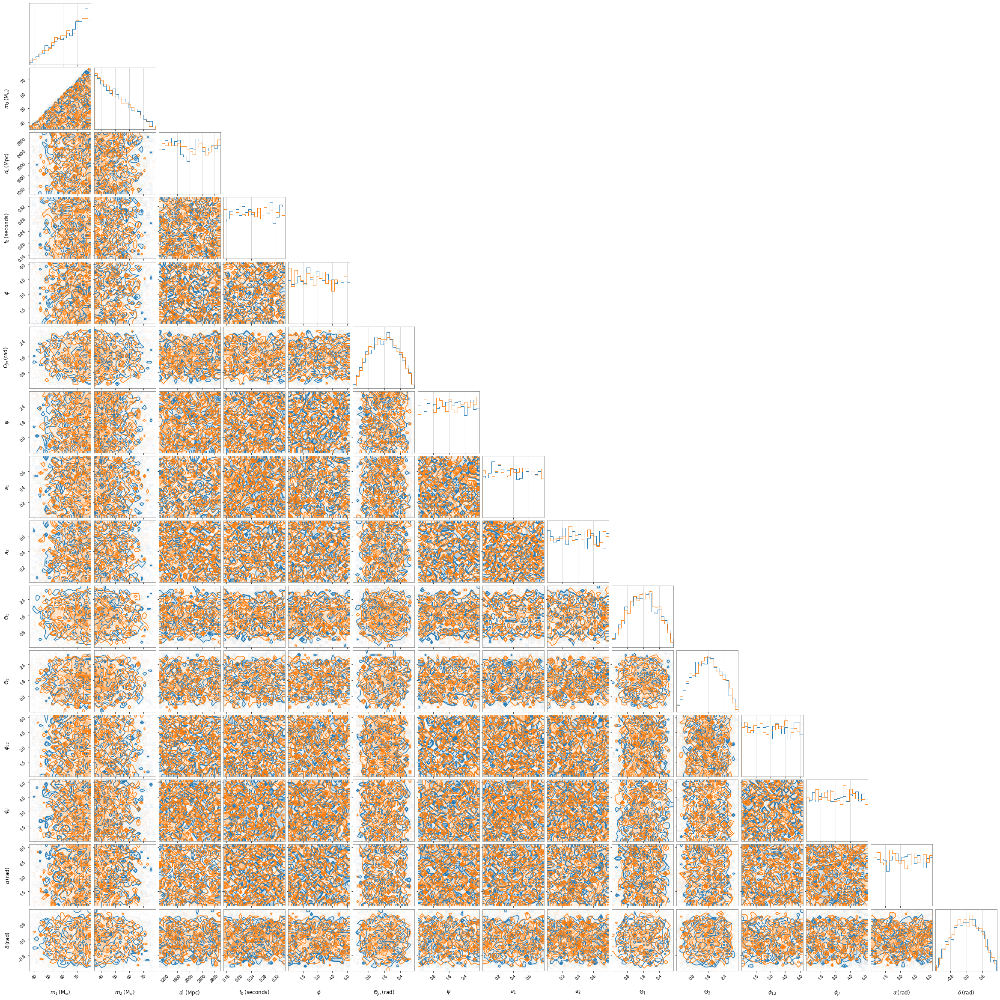

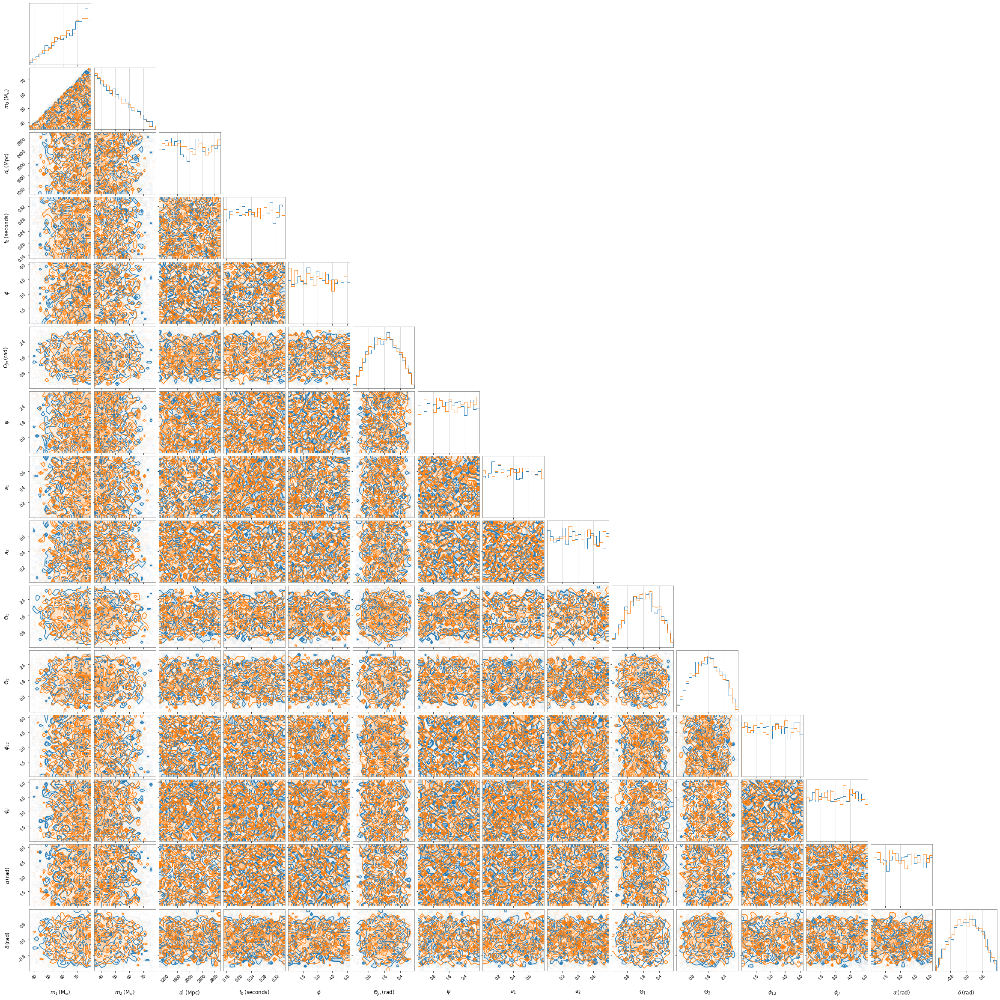

In [31]:
fg = corner.corner(convpars[resamp], labels = clabels, color="C0")
corner.corner(convpars2[resamp], fig=fg, color = "C1")

In [59]:
new_dec = np.random.uniform(size = 5000, low = -np.pi/2, high = np.pi/2)

In [45]:
np.sin(-np.pi/2)

-1.0

In [63]:
new_dec2 = np.arcsin(np.random.uniform(size = 5000, low = np.sin(-np.pi/2), high = np.sin(np.pi/2)))

In [54]:
priors = bilby.core.prior.Cosine(minimum=-np.pi/2,maximum=np.pi/2)

In [61]:
prsamp = priors.sample(5000)

In [51]:
priors

{'mass_1': Constraint(minimum=5, maximum=100, name='mass_1', latex_label='$m_1$', unit=None),
 'mass_2': Constraint(minimum=5, maximum=100, name='mass_2', latex_label='$m_2$', unit=None),
 'mass_ratio': Uniform(minimum=0.125, maximum=1, name='mass_ratio', latex_label='$q$', unit=None, boundary=None),
 'chirp_mass': Uniform(minimum=25, maximum=100, name='chirp_mass', latex_label='$\\mathcal{M}$', unit=None, boundary=None),
 'luminosity_distance': UniformSourceFrame(minimum=100.0, maximum=5000.0, cosmology=FlatLambdaCDM(name="Planck15", H0=67.7 km / (Mpc s), Om0=0.307, Tcmb0=2.725 K, Neff=3.05, m_nu=[0.   0.   0.06] eV, Ob0=0.0486), name='luminosity_distance', latex_label='$d_L$', unit=Unit("Mpc"), boundary=None),
 'dec': Cosine(minimum=-1.5707963267948966, maximum=1.5707963267948966, name='dec', latex_label='$\\mathrm{DEC}$', unit=None, boundary=None),
 'ra': Uniform(minimum=0, maximum=6.283185307179586, name='ra', latex_label='$\\mathrm{RA}$', unit=None, boundary='periodic'),
 'theta_j

(array([134., 381., 572., 693., 782., 719., 684., 566., 344.,
        125.]),
 array([-1.55094427, -1.24176686, -0.93258946, -0.62341205,
        -0.31423464, -0.00505724,  0.30412017,  0.61329757,
         0.92247498,  1.23165239,  1.54082979]),
 <BarContainer object of 10 artists>)

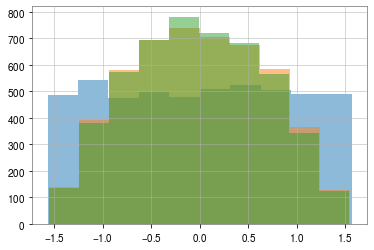

In [64]:
fig, ax = plt.subplots()
ax.hist(new_dec,alpha = 0.5)
ax.hist(new_dec2,alpha = 0.5)
ax.hist(prsamp,alpha = 0.5)

In [42]:
rnd = np.random.rand(1000)

(array([102., 112.,  82., 104., 110.,  95.,  92., 110.,  98.,
         95.]),
 array([0.00138302, 0.10123593, 0.20108884, 0.30094175,
        0.40079466, 0.50064757, 0.60050048, 0.70035339,
        0.8002063 , 0.90005921, 0.99991212]),
 <BarContainer object of 10 artists>)

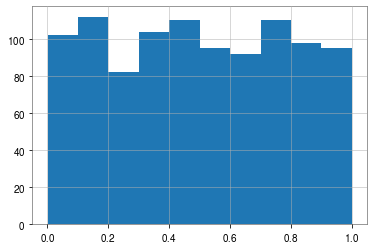

In [43]:
fig, ax = plt.subplots()
ax.hist(rnd)

(array([2., 0., 0., 0., 0., 0., 0., 1., 0., 1.]),
 array([1498.0862, 1631.7163, 1765.3464, 1898.9764, 2032.6066,
        2166.2368, 2299.8667, 2433.4968, 2567.127 , 2700.757 ,
        2834.3872], dtype=float32),
 <BarContainer object of 10 artists>)

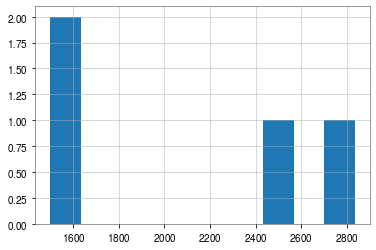

In [31]:
fig, ax = plt.subplots()
ax.hist(convtest[:,2])

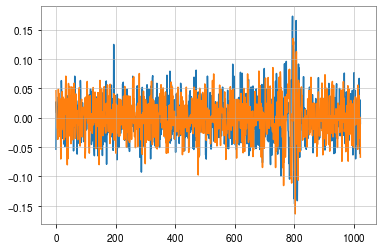

In [33]:
fig, ax = plt.subplots()
ax.plot(test.Y_noisy[1])

In [32]:
test.X[1]

<tf.Tensor: shape=(15,), dtype=float32, numpy=
array([0.9890115 , 0.54954475, 0.2814473 , 0.61829495,
       0.3751709 , 0.48268047, 0.097044  , 0.11595071,
       0.6273917 , 0.7523755 , 0.597055  , 0.9907217 ,
       0.47035074, 0.44446948, 0.17934969], dtype=float32)>

In [39]:
dt[0][1][4]

array([ 0.9719189 ,  0.6619712 ,  0.0914502 ,  0.54669666,
        0.7921221 ,  0.7009319 ,  0.5744984 ,  0.70353913,
        0.17162767,  0.56478274,  0.2620098 ,  0.8265784 ,
        0.33270162, -0.25173306,  0.61663306], dtype=float32)

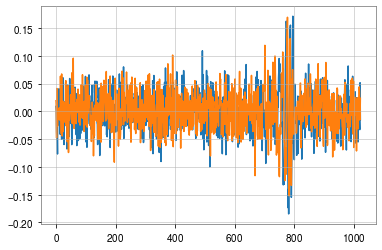

In [48]:
fig, ax = plt.subplots()
ax.plot(dt[0][0][4])

In [11]:
vt = DataLoader(val_dir, params = params, bounds = bounds, fixed_vals = fixed_vals, masks=masks,test_set = False, val_set = True)

In [12]:
vt.load_next_chunk() 

Reached maximum number of chunks, restarting index and shuffling files
load_time chunk 0: 0.22191452980041504


In [ ]:
dt.Y_noisefree

In [7]:
model = CVAE(params, bounds, masks)
    
# load in trained model
print("loading model weights....")
latest = tf.train.latest_checkpoint(os.path.join(model_dir,"checkpoint"))
model.load_weights(latest)
    

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 1024, 2)]         0         
_________________________________________________________________
conv1d (Conv1D)              (None, 993, 128)          8320      
_________________________________________________________________
batch_normalization (BatchNo (None, 993, 128)          512       
_________________________________________________________________
activation (Activation)      (None, 993, 128)          0         
_________________________________________________________________
conv1d_1 (Conv1D)            (None, 978, 64)           131136    
_________________________________________________________________
batch_normalization_1 (Batch (None, 978, 64)           256       
_________________________________________________________________
activation_1 (Activation)    (None, 978, 64)           0     

In [20]:
np.where(dt.X[:,1] < 0.2)

(array([  37,   66,   73,   77,  123,  134,  163,  166,  172,
         219,  254,  349,  410,  432,  441,  444,  484,  487,
         495,  506,  524,  528,  533,  535,  615,  622,  638,
         655,  671,  678,  706,  709,  753,  782,  787,  791,
         795,  839,  841,  886,  901,  927,  957,  984, 1001,
        1014]),)

In [9]:
ind = 37

In [10]:
dt.X[ind,0:2]*90 + 10

<tf.Tensor: shape=(2,), dtype=float32, numpy=array([84.97853, 23.97108], dtype=float32)>

In [21]:
print("generating samples....")

samples1 = model.gen_samples(dt.Y_noisefree[ind:ind+1], nsamples = 5000)


generating samples....


In [40]:
dt.X[ind:ind+10][:,3]

AttributeError: 'DataLoader' object has no attribute 'X'

In [11]:
np.shape(dt[0][0])

(512, 1024, 2)

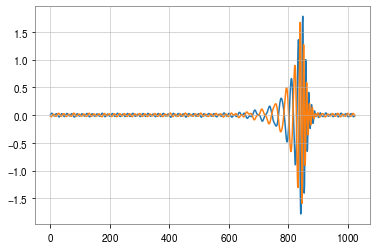

In [44]:
ind = 2193
fig, ax = plt.subplots()
ax.plot(dt.Y_noisefree[ind:ind+1][0][:,0])
ax.plot(dt.Y_noisefree[ind:ind+1][0][:,1])

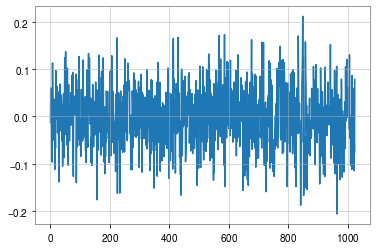

In [45]:
ind1 = ind % 512
fig, ax = plt.subplots()
ax.plot(dt[4][0][ind1][:,0])
#ax.plot(dt.Y_noisefree[ind:ind+1][0][:,1])

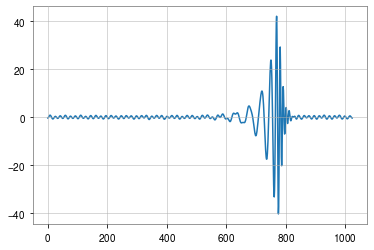

In [67]:
ind = 2
fig, ax = plt.subplots()
ax.plot(vt.Y_noisefree[ind:ind+1][0][:,0])
#ax.plot(dt.Y_noisefree[ind:ind+1][0][:,1])

[0.92922306 0.8002255  0.27719247 0.11552928 0.889301
 0.96291906 0.91064537 0.33343068 0.3577195  0.692534
 0.23187561 0.93105954 0.08629639 0.9502213  0.4703595 ]


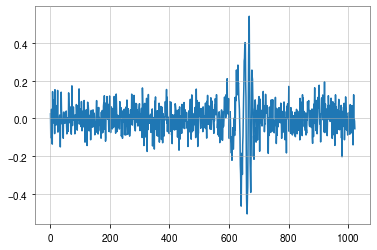

In [15]:
ind1 = 2
print(vt[0][1][ind1])
fig, ax = plt.subind1 = ind % 512
fig, ax = plt.subplots()
ax.plot(dt[4][0][ind1][:,0])
#ax.plot(dt.Y_noisefree[ind:ind+1][0][:,1])plots()
ax.plot(vt[0][0][ind1][:,0])
#ax.plot(dt.Y_noisefree[ind:ind+1][0][:,1])

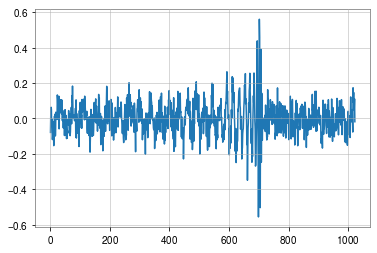

In [30]:
ind1 = 124
fig, ax = plt.subplots()
ax.plot(dt[0][0][ind1][:,0])
#ax.plot(dt.Y_noisefree[ind:ind+1][0][:,1])

In [49]:
len(dt[4][1])

512

In [52]:
dt[4][1][ind1]

array([0.96050566, 0.839889  , 0.7570123 , 0.8570163 ,
       0.8831632 , 0.40098342, 0.10112456, 0.76561546,
       0.15058926, 0.27596554, 0.7240012 , 0.2583463 ,
       0.77667385, 0.5644538 , 0.08456286], dtype=float32)

(array([], shape=(0, 1024, 2), dtype=float32),
 array([], shape=(0, 15), dtype=float32))

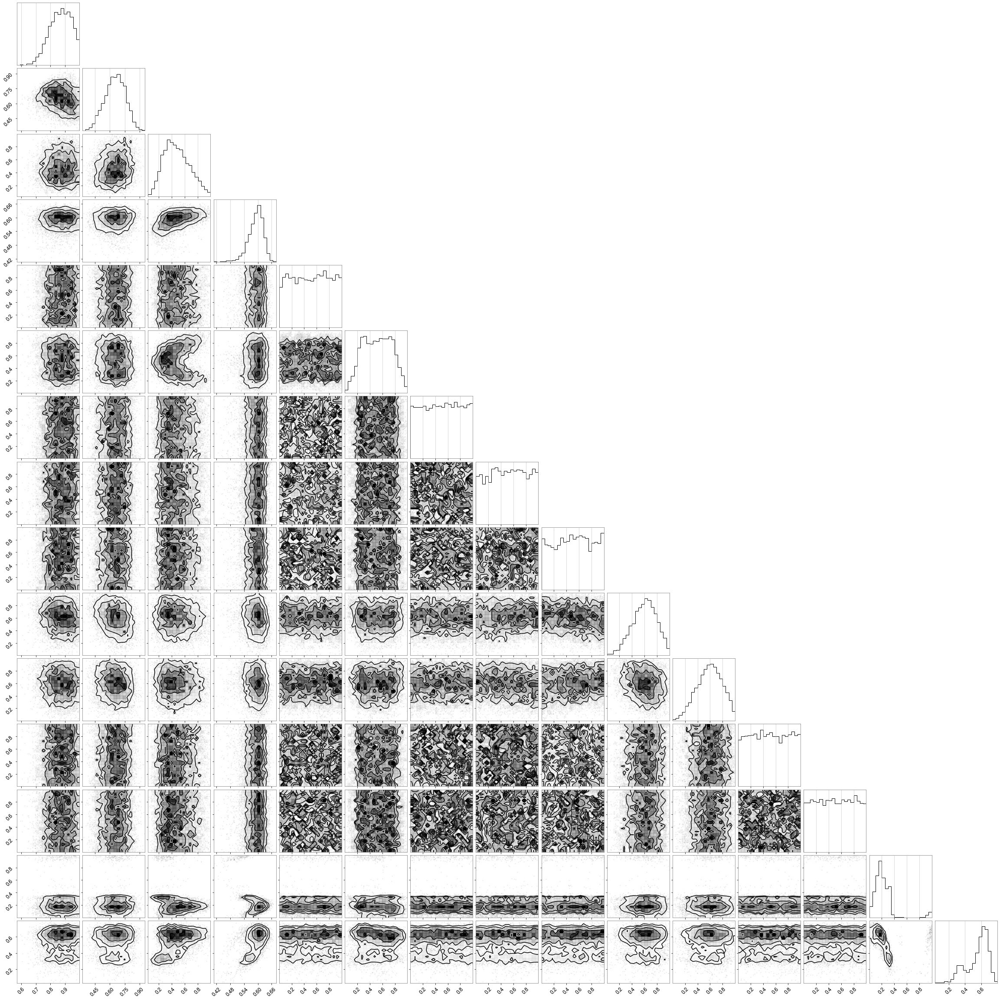

In [15]:
corner.corner(np.array(samples1))

In [57]:
filename = "/home/joseph.bayley/data/CBC/O4MDC/test_sets/1024Hz_1s_full_15par_2det_fullparam_massconstrain_corr/test_dynesty2/1024Hz_1s_full_15par_2det_fullparam_corr_0_result.hdf5"

In [63]:
fl = h5py.File(filename, 'r')

In [65]:
fl['posterior'].keys()

<KeysViewHDF5 ['a_1', 'a_2', 'dec', 'geocent_time', 'log_likelihood', 'log_prior', 'luminosity_distance', 'mass_1', 'mass_2', 'phase', 'phi_12', 'phi_jl', 'psi', 'ra', 'theta_jn', 'tilt_1', 'tilt_2']>

In [67]:
pst = {}
for q in params['bilby_pars']:
    p = q 
    pst[q] = fl['posterior'][p][:]

In [68]:
pst

{'mass_1': array([99.87341755, 75.0739827 , 96.19294706, ..., 97.27228752,
        98.43156841, 98.43156841]),
 'mass_2': array([80.7183982 , 45.1899404 , 77.4118926 , ..., 92.02850275,
        94.69417067, 94.69417067]),
 'luminosity_distance': array([4136.39564699, 3655.06474625, 4164.73466073, ...,
        2294.37876281, 1473.0676786 , 1473.0676786 ]),
 'geocent_time': array([1.32502927e+09, 1.32502927e+09, 1.32502927e+09, ...,
        1.32502927e+09, 1.32502927e+09, 1.32502927e+09]),
 'theta_jn': array([1.30517615, 0.96879756, 1.92840379, ..., 1.17423936,
        1.17086964, 1.17086964]),
 'psi': array([1.86636687, 2.02797313, 0.41830281, ..., 2.69309391,
        0.06290568, 0.06290568]),
 'a_1': array([0.841127  , 0.52367584, 0.11903274, ..., 0.85929979,
        0.75173021, 0.75173021]),
 'a_2': array([0.23355202, 0.30962137, 0.93515613, ..., 0.89014979,
        0.86015958, 0.86015958]),
 'tilt_1': array([2.62424457, 0.81193447, 1.8989431 , ..., 2.61555847,
        1.65969625, 1.6